#[ AlexNet - Architecture](https://proceedings.neurips.cc/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf)
<center><img src= "https://learnopencv.com/wp-content/uploads/2018/05/AlexNet-1.png"></center>

> AlexNet consists of 5 Convolutional Layers and 3 Fully Connected Layers.

> Multiple Convolutional Kernels (a.k.a filters) extract interesting features in an image. In a single convolutional layer, there are usually many kernels of the same size. For example, the first Conv Layer of AlexNet contains 96 kernels of size 11x11x3. Note the width and height of the kernel are usually the same and the depth is the same as the number of channels.

> The first two Convolutional layers are followed by the Overlapping Max Pooling layers that we describe next. The third, fourth and fifth convolutional layers are connected directly. The fifth convolutional layer is followed by an Overlapping Max Pooling layer, the output of which goes into a series of two fully connected layers. The second fully connected layer feeds into a softmax classifier with 1000 class labels.

> ReLU nonlinearity is applied after all the convolution and fully connected layers. The ReLU nonlinearity of the first and second convolution layers are followed by a local normalization step before doing pooling. But researchers later didn’t find normalization very useful. So we will not go in detail over that


## Implementing Alex Net on Intel dataset

### Import Section

In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import time
import os
import cv2
import datetime
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.utils import plot_model
from keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm
tqdm.pandas()
import glob
import pathlib

## Lets pull data

In [2]:
!pip install -q kaggle
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json
!mkdir dataset
! kaggle datasets download -d puneet6060/intel-image-classification
!unzip intel-image-classification.zip -d dataset

Streaming output truncated to the last 5000 lines.
  inflating: dataset/seg_train/seg_train/mountain/7506.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7537.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7539.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7551.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7560.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7565.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7578.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7581.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7586.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7647.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7652.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7654.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7662.jpg  
  inflating: dataset/seg_train/seg_train/mountain/767.jpg  
  inflating: dataset/seg_train/seg_train/mountain/7672.jpg  
  inflating: dataset/seg_train/seg_

## Lets Analyse the dataset

In [3]:
data_dir = '/content/dataset'
data_dir = pathlib.Path(data_dir)
train_buildings=list(data_dir.glob('seg_train/seg_train/buildings/*'))
train_forest=list(data_dir.glob('seg_train/seg_train/forest/*'))
train_glacier=list(data_dir.glob('seg_train/seg_train/glacier/*'))
train_mountain=list(data_dir.glob('seg_train/seg_train/mountain/*'))
train_sea=list(data_dir.glob('seg_train/seg_train/sea/*'))
train_street=list(data_dir.glob('seg_train/seg_train/street/*'))
test_buildings=list(data_dir.glob('seg_test/seg_test/buildings/*'))
test_forest=list(data_dir.glob('seg_test/seg_test/forest/*'))
test_glacier=list(data_dir.glob('seg_test/seg_test/glacier/*'))
test_mountain=list(data_dir.glob('seg_test/seg_test/mountain/*'))
test_sea=list(data_dir.glob('seg_test/seg_test/sea/*'))
test_street=list(data_dir.glob('seg_test/seg_test/street/*'))
print('*'*30 + ' train Images '+'*'*30  )
print()
print('Number of train_buildings Images : ',len(train_buildings))
print('Number of train_forest Images : ',len(train_forest))
print('Number of train_glacier Images : ',len(train_glacier))
print('Number of train_mountain Images : ',len(train_mountain))
print('Number of train_sea Images : ',len(train_sea))
print('Number of train_street Images : ',len(train_street))
print()
print('*'*30 + ' test Images '+'*'*30  )
print()
print('Number of test_buildings Images : ',len(test_buildings))
print('Number of test_forest Images : ',len(test_forest))
print('Number of test_glacier Images : ',len(test_glacier))
print('Number of test_mountain Images : ',len(test_mountain))
print('Number of test_sea Images : ',len(test_sea))
print('Number of test_street Images : ',len(test_street))


****************************** train Images ******************************

Number of train_buildings Images :  2191
Number of train_forest Images :  2271
Number of train_glacier Images :  2404
Number of train_mountain Images :  2512
Number of train_sea Images :  2274
Number of train_street Images :  2382

****************************** test Images ******************************

Number of test_buildings Images :  437
Number of test_forest Images :  474
Number of test_glacier Images :  553
Number of test_mountain Images :  525
Number of test_sea Images :  510
Number of test_street Images :  501


## Lets See Few Images

****************************** Sample Buildings ******************************


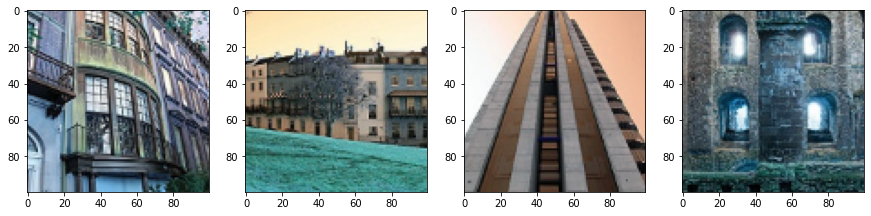

****************************** Sample forest ******************************


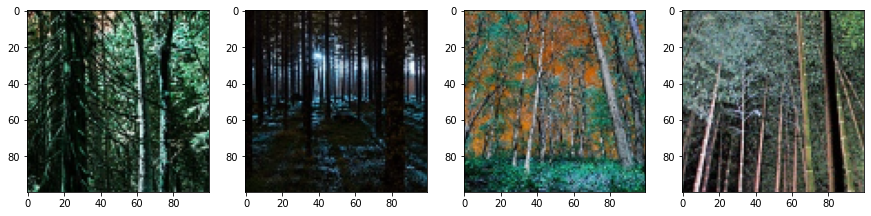

****************************** Sample glacier ******************************


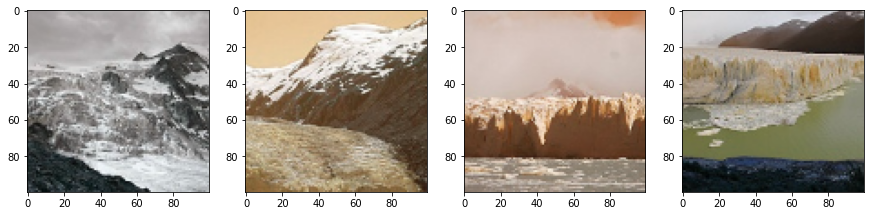

****************************** Sample mountain ******************************


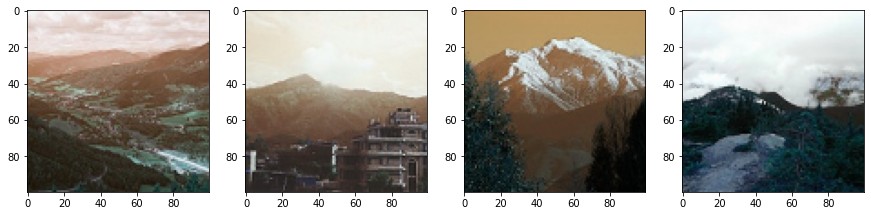

****************************** Sample sea ******************************


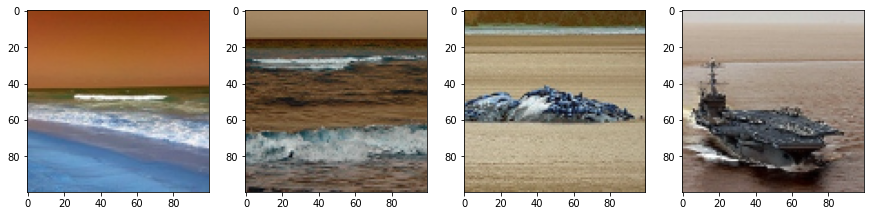

****************************** Sample street ******************************


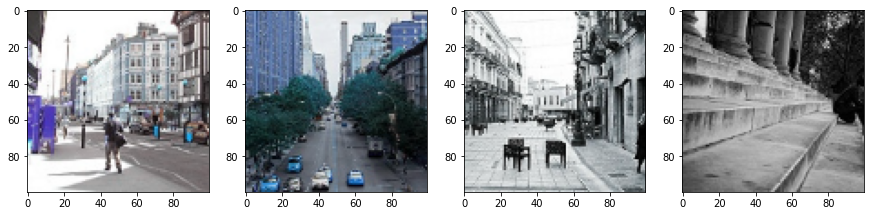

In [4]:
fig = plt.figure(figsize=(15, 10))
rows = 1
columns = 4
print('*'*30 + ' Sample Buildings ' + '*'*30)
for i in range(4):  
  fig.add_subplot(rows, columns, i+1)
  image = cv2.imread(str(list(data_dir.glob('seg_train/seg_train/buildings/*'))[i+50]))
  image = cv2.resize(image , (100 , 100))
  plt.imshow(image)
plt.show()
fig = plt.figure(figsize=(15, 10))
print('*'*30 + ' Sample forest ' + '*'*30)
for i in range(4):  
  fig.add_subplot(rows, columns, i+1)
  image = cv2.imread(str(list(data_dir.glob('seg_train/seg_train/forest/*'))[i+50]))
  image = cv2.resize(image , (100 , 100))
  plt.imshow(image)
plt.show()
fig = plt.figure(figsize=(15, 10))
print('*'*30 + ' Sample glacier ' + '*'*30)
for i in range(4):  
  fig.add_subplot(rows, columns, i+1)
  image = cv2.imread(str(list(data_dir.glob('seg_train/seg_train/glacier/*'))[i+50]))
  image = cv2.resize(image , (100 , 100))
  plt.imshow(image)
plt.show()
fig = plt.figure(figsize=(15, 10))
print('*'*30 + ' Sample mountain ' + '*'*30)
for i in range(4):  
  fig.add_subplot(rows, columns, i+1)
  image = cv2.imread(str(list(data_dir.glob('seg_train/seg_train/mountain/*'))[i+50]))
  image = cv2.resize(image , (100 , 100))
  plt.imshow(image)
plt.show()
fig = plt.figure(figsize=(15, 10))
print('*'*30 + ' Sample sea ' + '*'*30)
for i in range(4):  
  fig.add_subplot(rows, columns, i+1)
  image = cv2.imread(str(list(data_dir.glob('seg_train/seg_train/sea/*'))[i+50]))
  image = cv2.resize(image , (100 , 100))
  plt.imshow(image)
plt.show()
fig = plt.figure(figsize=(15, 10))
print('*'*30 + ' Sample street ' + '*'*30)
for i in range(4):  
  fig.add_subplot(rows, columns, i+1)
  image = cv2.imread(str(list(data_dir.glob('seg_train/seg_train/street/*'))[i+50]))
  image = cv2.resize(image , (100 , 100))
  plt.imshow(image)
plt.show()

## Lets create train and test data generators

In [5]:
train_datagen = ImageDataGenerator(rescale=1./255,rotation_range=45,shear_range=0.2,width_shift_range=0.2,height_shift_range=0.2,zoom_range=0.2,horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory('/content/dataset/seg_train/seg_train',target_size=(277, 277),batch_size=32,class_mode='categorical')
test_generator = test_datagen.flow_from_directory('/content/dataset/seg_test/seg_test',target_size=(277, 277),batch_size=32,class_mode='categorical')

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


## Lets see what image data generator got

In [6]:
for batch in train_generator:
  images = batch[0]
  labels = batch[1]
  fig = plt.figure(figsize=(25, 25))
  for i in range(len(images)):  
    fig.add_subplot(6, 6, i+1)
    plt.imshow(images[i])
    plt.colorbar()
    plt.title(labels[i])
  plt.show()
  break


Output hidden; open in https://colab.research.google.com to view.

* what value assigned to which category:

1. Building.  --- > [1,0,0,0,0,0]
2. forest.  --- > [0,1,0,0,0,0]
3. glacier.  --- > [0,0,1,0,0,0]
4. mountain.  --- > [0,0,0,1,0,0]
5. sea.  --- > [0,0,0,0,1,0]
6. street.  --- > [0,0,0,0,0,1]

Lets Build the model using Keras Tuner


## Lets build the AlexNet Model

In [7]:
alexnet_model = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(277,277,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(1,1), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(1,1), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(6, activation='softmax')
])

In [8]:
%load_ext tensorboard
log_dir = os.path.join("logs",'fits', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1,write_graph=True)
%reload_ext tensorboard

In [9]:
alexnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [10]:
alexnet_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 67, 67, 96)        34944     
                                                                 
 batch_normalization (BatchN  (None, 67, 67, 96)       384       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 33, 33, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 33, 33, 256)       614656    
                                                                 
 batch_normalization_1 (Batc  (None, 33, 33, 256)      1024      
 hNormalization)                                                 
                                                        

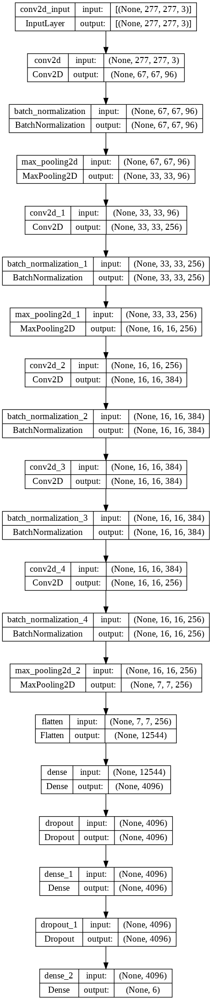

In [11]:
plot_model(alexnet_model,show_shapes = True)

In [15]:
alexnet_model.fit(train_generator,epochs=5,batch_size = 32,validation_data=test_generator,validation_freq=1,callbacks=[tensorboard_callback])


Epoch 1/5
439/439 [==============================] - 220s 501ms/step - loss: 1.2376 - accuracy: 0.5389 - val_loss: 1.3389 - val_accuracy: 0.5290
Epoch 2/5
439/439 [==============================] - 220s 501ms/step - loss: 1.2012 - accuracy: 0.5523 - val_loss: 1.6812 - val_accuracy: 0.3650
Epoch 3/5
439/439 [==============================] - 219s 499ms/step - loss: 1.1420 - accuracy: 0.5812 - val_loss: 0.9704 - val_accuracy: 0.6477
Epoch 4/5
439/439 [==============================] - 220s 500ms/step - loss: 1.0981 - accuracy: 0.5958 - val_loss: 1.4254 - val_accuracy: 0.5053
Epoch 5/5
439/439 [==============================] - 220s 501ms/step - loss: 1.0435 - accuracy: 0.6225 - val_loss: 0.9017 - val_accuracy: 0.6560


In [16]:
alexnet_scores=alexnet_model.evaluate(test_generator)
print("alexnet loss : ",alexnet_scores[0])
print("alexnet accuracy : ",alexnet_scores[1])

94/94 [==============================] - 6s 63ms/step - loss: 0.9017 - accuracy: 0.6560
alexnet loss :  0.9017372131347656
alexnet accuracy :  0.656000018119812


In [17]:
%tensorboard --logdir logs/fits

Output hidden; open in https://colab.research.google.com to view.